In [16]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import numpy as np

In [5]:
import networkx as nx
import numpy as np

# Create a directed weighted graph
G = nx.DiGraph()
G.add_weighted_edges_from([(1, 2, 5.0), (2, 3, 3.0), (3, 1, 2.0)])

# Get adjacency matrix (scipy sparse matrix)
adj_matrix = nx.adjacency_matrix(G, weight='weight')

# Convert to dense numpy array if needed
adj_dense = adj_matrix.toarray()

print("Adjacency Matrix (Dense):\n", adj_dense)

Adjacency Matrix (Dense):
 [[0. 5. 0.]
 [0. 0. 3.]
 [2. 0. 0.]]


In [17]:
G3 = nx.read_edgelist(".\\congress_network\\congress.edgelist", data=True)

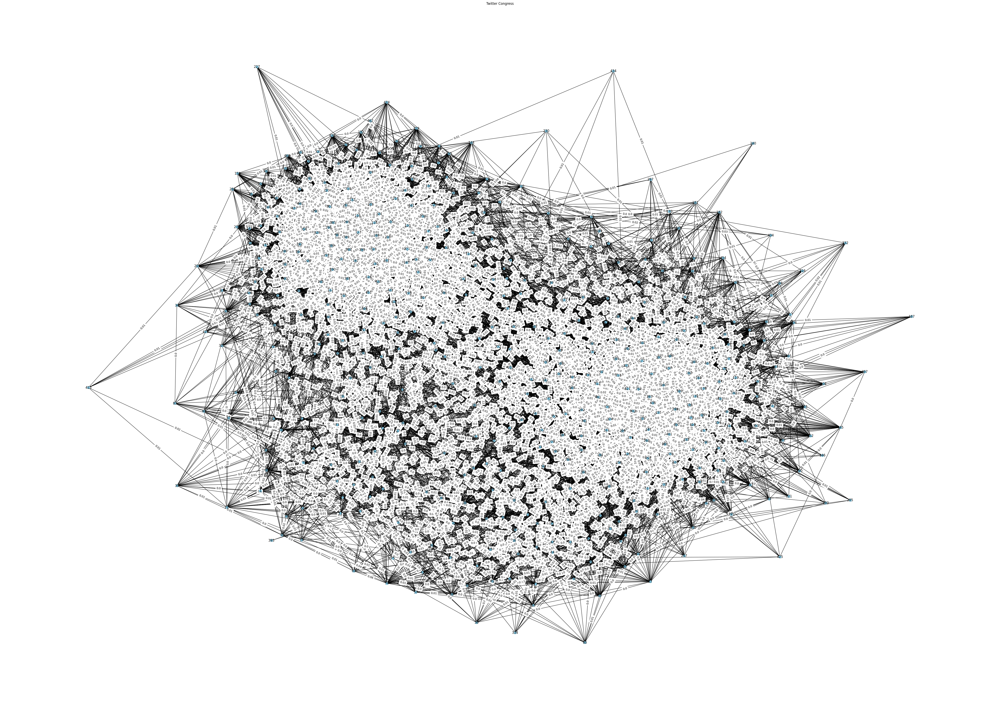

In [18]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming G3 is your graph
pos = nx.spring_layout(G3, seed=42)

# Get edge attributes ('weight') and round them to 2 decimal places
edge_labels = nx.get_edge_attributes(G3, 'weight')
edge_labels = {k: round(v, 2) for k, v in edge_labels.items()}

# Plot the graph
plt.figure(figsize=(50, 35))
nx.draw(G3, pos, with_labels=True, node_color='skyblue', node_size=80, arrows=True)
nx.draw_networkx_edge_labels(G3, pos, edge_labels=edge_labels)

# Title and display
plt.title("Twitter Congress")
plt.show()


In [19]:
# Get adjacency matrix (scipy sparse matrix)
adj_numpy = nx.to_numpy_array(G3, weight='weight')
print("NumPy Adjacency Matrix:\n", adj_numpy)

NumPy Adjacency Matrix:
 [[0.         0.00364964 0.00210526 ... 0.         0.         0.        ]
 [0.00364964 0.         0.00182482 ... 0.         0.         0.        ]
 [0.00210526 0.00182482 0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [13]:
type(adj_numpy)

numpy.ndarray

In [21]:
import numpy as np
from graph import Graph
from numba import cuda
import cupy as cp
import time

def Normalize(matrix):
    matrix2 = matrix.copy()

    for j in range(len(matrix2[0])):
        temp = 0
        for i in range(len(matrix2)):
            temp += matrix2[i][j]
        for i in range(len(matrix2)):
            matrix2[i][j] = matrix2[i][j] / temp
        
    return matrix2

def Inflate(matrix, r):
    matrix = cp.power(matrix, r)
    col_sums = cp.sum(matrix, axis=0)
    matrix = matrix / col_sums
    return matrix

@cuda.jit
def matmul(A, B, C):
    i, j = cuda.grid(2)
    if i < C.shape[0] and j < C.shape[1]:
        tmp = 0.0
        for k in range(A.shape[1]):
            tmp += A[i, k] * B[k, j]
        C[i, j] = tmp

def powerMatrix(matrix, n, bpg, tpb):
    if n < 1:
        raise ValueError("Pangkat matrix harus >= 1")

    matrix1 = matrix
    matrix2 = cp.zeros_like(matrix)

    for i in range(n - 1):
        matmul[bpg, tpb](matrix1, matrix, matrix2)
        cuda.synchronize()  # penting untuk sinkronisasi kernel
        matrix1 = matrix2.copy()

    return matrix1

def print_matrix(matrix):
    for row in matrix:
        print(" ".join(f"{val:.2f}" for val in row))

def MarkovCluster(matrix_a, e, r, iter):
    matrix = matrix_a

    # Add self-loops
    for i in range(len(matrix)):
        matrix[i][i] = 1

    # matrix = Normalize(matrix)

    matrix = cp.asarray(matrix)

    # Setup CUDA kernel execution config
    threadsperblock = (32, 32)
    blockspergrid_x = int(np.ceil(matrix.shape[0] / threadsperblock[0]))
    blockspergrid_y = int(np.ceil(matrix.shape[1] / threadsperblock[1]))
    blockspergrid = (blockspergrid_x, blockspergrid_y)

    iterate = iter
    tol = 1e-5
    ptr = 0
    converged = False

    while ptr < iterate and not converged:
        prev_matrix = matrix.copy()

        matrix = powerMatrix(matrix, e, bpg=blockspergrid, tpb=threadsperblock)
        matrix = Inflate(matrix, r)

        # Cek konvergensi
        diff = cp.abs(matrix - prev_matrix)
        max_diff = cp.max(diff)
        if max_diff < tol:
            converged = True

        ptr += 1

    return matrix

# =========================== Main Program ===========================


e_1 = 2
r_1 = 2
'''
n_nodes = 1000
n_edge = 1200
graph = Graph(directed=False)
graph.generate_random_connected_graph(num_nodes=n_nodes, num_edges=n_edge)
'''

start = time.time()
MarkovMatrix = MarkovCluster(matrix_a=adj_numpy, e = e_1, r = r_1, iter = 2)
end = time.time()

print("Adjacency Matrix of Last Iteration:")
# Uncomment to print
print_matrix(cp.asnumpy(MarkovMatrix))

print(f"Ukuran matriks: {adj_numpy.size}, total edge: banyak")
print(f"Parameter: e = {e_1}, r = {r_1}")
print(f"Waktu eksekusi: {end - start:.4f} detik")

Adjacency Matrix of Last Iteration:
1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00